# <a id='toc1_'></a>[Предобработка и формирование train, valid, json-файлов](#toc0_)

В данному нотбуке проводится первичная обработка фотографий, создание train, valid датасетов

- [Предобработка и формирование train, valid, json-файлов](#toc1_)    
  - [Загрузка, анализ и перваночальная обработка изображений](#toc1_1_)    
  - [Разбитие датасетов на train и valid](#toc1_2_)    
  - [Создание json-файла с описанием объектов датасета](#toc1_3_)    
  - [Конечный вид json-файла](#toc1_4_)    
  - [Создание тестового датасета](#toc1_5_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

In [1]:
import os
import numpy as np
import json
import pandas as pd
import datetime
from PIL import Image, ImageFile
from albumentations.augmentations.geometric.resize import Resize
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
from os.path import getctime

ImageFile.LOAD_TRUNCATED_IMAGES = True
PATH_IMAGES_INPUT = "data/raw/images"
PATH_IMAGES_OUTPUT = "data/interim/images"
PATH_INTERIUM = "data/interim"

## <a id='toc1_1_'></a>[Загрузка, анализ и перваночальная обработка изображений](#toc0_)

In [103]:
df = pd.read_excel(os.path.join(os.path.dirname(PATH_IMAGES_INPUT), "train_valid_object.xlsx"))
df.sample(1)

,Имя,Диван,Шкаф,Кресло,Стул,Стол,Комод,Кровать
463,463,NaN,NaN,1.0,NaN,NaN,NaN,NaN


In [104]:
df.columns = [
    "image",
    "sofa",
    "wardrobe",
    "chair",
    "armchair",
    "table",
    "commode",
    "bed",
]
df.fillna(0, inplace=True)

In [105]:
df.sample(1)

,image,sofa,wardrobe,chair,armchair,table,commode,bed
519,519,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [106]:
df["image"] = df["image"].apply(
    lambda x: str(x) + ".png" if not str(x).endswith(".png") else str(x)
)

In [107]:
image = Image.open(os.path.join(PATH_IMAGES_INPUT, df.loc[0, "image"]))

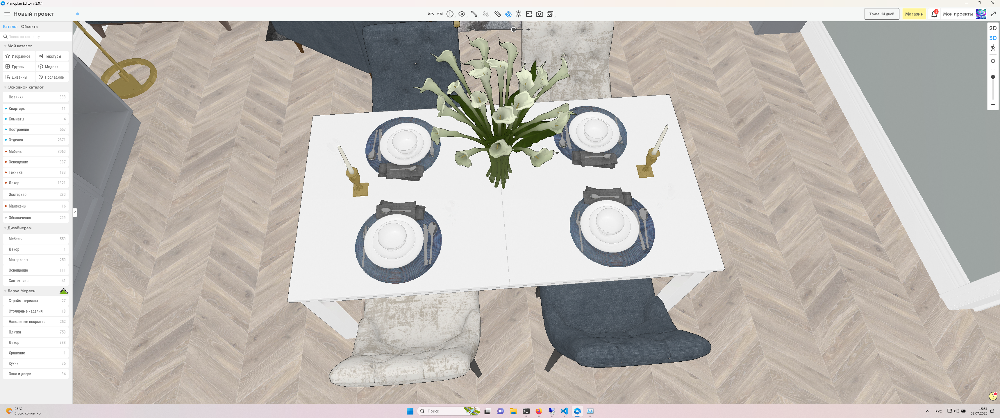

In [108]:
image

In [109]:
image.height, image.width

(1440, 3440)

In [110]:
np.array(image, dtype=float).shape

(1440, 3440, 4)

Как видно из представленных данных изображение четырех канальное, имеет лишние рамки и очень большое. Необходимо его обрезать и конвентировать его в RGB и изменить масштаб

In [68]:
resize = Resize(426, 640)


def size(image):
    image = image.crop((265, 112, 3395, 1320))
    image = np.array(image, dtype=float)
    image = resize(image=image)["image"]
    image = Image.fromarray(image.astype(np.uint8))

    return image


for name in tqdm(os.listdir(PATH_IMAGES_INPUT)):
    path_input = os.path.join(PATH_IMAGES_INPUT, name)
    image = Image.open(path_input).convert("RGB")
    image_new = size(image)

    path_output = os.path.join(PATH_IMAGES_OUTPUT, name.replace(".png", ".jpg"))
    image_new.save(path_output)

  0%|          | 0/1001 [00:00<?, ?it/s]

Было:

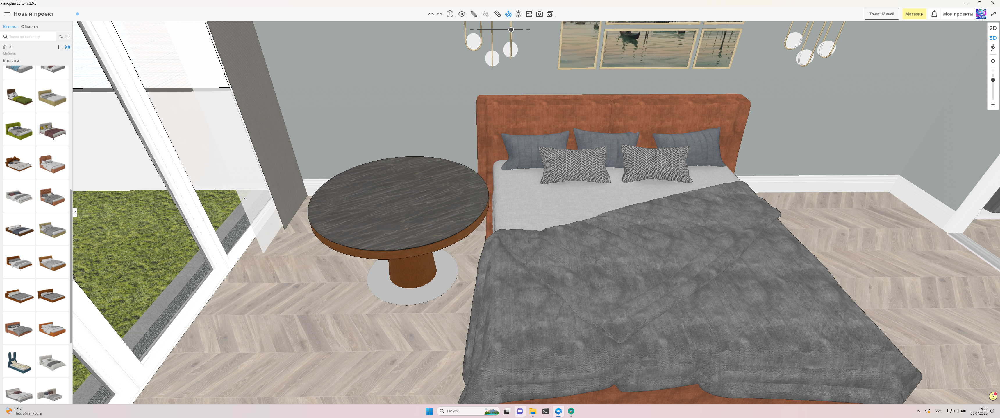

In [111]:
Image.open(os.path.join(PATH_IMAGES_INPUT, "901.png"))

Стало:

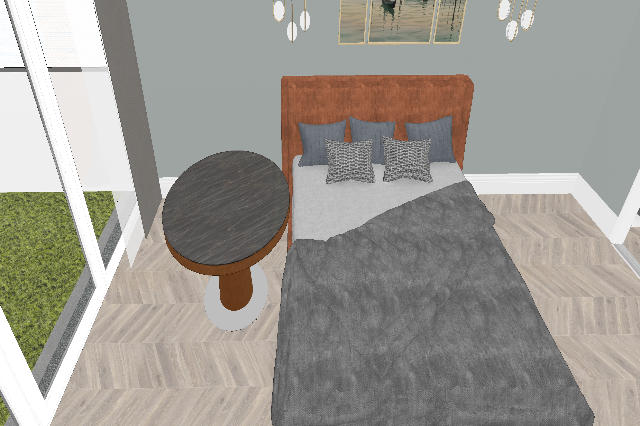

In [112]:
Image.open(os.path.join(PATH_IMAGES_OUTPUT, "901.jpg"))

## <a id='toc1_2_'></a>[Разбитие датасетов на train и valid](#toc0_)

In [113]:
df.image = df.image.apply(lambda x: x.replace(".png", ".jpg"))

In [115]:
df["object_count"] = df.apply(lambda x: x[1:].sum(), axis=1)

In [116]:
df.object_count.value_counts()

object_count
1.0    543
2.0    293
3.0    126
4.0     28
5.0      7
6.0      2
0.0      2
Name: count, dtype: int64

Пример половина изображений, содержат 1 объект. Надо сформировать датасеты с учетом этого.
Для этого: 
- выделим датасет с одним объектом на изображении; 
- разделим его на тренировочную и валидационные датасеты, стратифицирующим признаком будет тип объекта на изображении;
- разделим датасет, где изображений больше одного на тренировочную и валидационные датасеты, стратифицирующим признаком будет количество объектов на изображении.

In [117]:
df_one = df.query("object_count == 1")

In [118]:
df_one["object_index"] = df_one.apply(lambda x: x.tolist()[1:-1].index(1), axis=1)

/tmp/ipykernel_3988433/2322438475.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_one["object_index"] = df_one.apply(lambda x: x.tolist()[1:-1].index(1), axis=1)


In [120]:
df_one.sample(3)

,image,sofa,wardrobe,chair,armchair,table,commode,bed,object_count,object_index
579,579.jpg,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,2
116,116.jpg,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,6
465,465.jpg,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,2


In [121]:
train_df_one_, valid_df_one_ = train_test_split(
    df_one, test_size=0.2, shuffle=True, stratify=df_one.object_index
)

In [122]:
train_df_one = train_df_one_.drop(["object_count", "object_index"], axis=1)
valid_df_one = valid_df_one_.drop(["object_count", "object_index"], axis=1)

In [123]:
df_one = df.query("object_count != 1")

In [124]:
train_df_few_, valid_df_few_ = train_test_split(
    df_one, test_size=0.2, shuffle=True, stratify=df_one.object_count
)

In [125]:
train_df_few = train_df_few_.drop(["object_count"], axis=1)
valid_df_few = valid_df_few_.drop(["object_count"], axis=1)

In [126]:
train_df = pd.concat([train_df_one, train_df_few]).reset_index(drop=True)
valid_df = pd.concat([valid_df_one, valid_df_few]).reset_index(drop=True)

In [127]:
train_df.to_csv(os.path.join(PATH_INTERIUM, "train.csv"), index=False)
valid_df.to_csv(os.path.join(PATH_INTERIUM, "valid.csv"), index=False)

## <a id='toc1_3_'></a>[Создание json-файла с описанием объектов датасета](#toc0_)

In [84]:
f = open(os.path.join(PATH_INTERIUM, "instances_val2017.json"))
data = json.load(f)

In [85]:
print(data.keys())
for name in data.keys():
    print("")
    if type(data[name]) == list:
        print(data[name][0])
        print(data[name][0].keys())
    else:
        print(data[name])
        print(data[name].keys())

dict_keys(['info', 'licenses', 'images', 'annotations', 'categories'])

{'description': 'COCO 2017 Dataset', 'url': 'http://cocodataset.org', 'version': '1.0', 'year': 2017, 'contributor': 'COCO Consortium', 'date_created': '2017/09/01'}
dict_keys(['description', 'url', 'version', 'year', 'contributor', 'date_created'])

{'url': 'http://creativecommons.org/licenses/by-nc-sa/2.0/', 'id': 1, 'name': 'Attribution-NonCommercial-ShareAlike License'}
dict_keys(['url', 'id', 'name'])

{'license': 4, 'file_name': '000000397133.jpg', 'coco_url': 'http://images.cocodataset.org/val2017/000000397133.jpg', 'height': 427, 'width': 640, 'date_captured': '2013-11-14 17:02:52', 'flickr_url': 'http://farm7.staticflickr.com/6116/6255196340_da26cf2c9e_z.jpg', 'id': 397133}
dict_keys(['license', 'file_name', 'coco_url', 'height', 'width', 'date_captured', 'flickr_url', 'id'])

{'segmentation': [[510.66, 423.01, 511.72, 420.03, 510.45, 416.0, 510.34, 413.02, 510.77, 410.26, 510.77, 407.5, 510.34, 405.16, 51

Как видно из данных выше, описание датасета COCO содержит общие данные, сведения о лицензии, изображениях, аннотации к ним, данные о категориях. 

При формировании датасета по примеру json далее не будут указываться какие-либо ссылки, версии, сведения о лицензии, данные об аннотация будет соответствовать мультилабел классификации.

In [86]:
# для загрузки сохраненных датасетов с прошлых шагов
# train_df = pd.read_csv(os.path.join(PATH_INTERIUM, 'train.csv'))
# valid_df = pd.read_csv(os.path.join(PATH_INTERIUM, 'valid.csv'))

In [87]:
data_for_json = {
    "info": {
        "description": "Interior synthetic dataset",
        "version": 1.0,
        "year": 2023,
        "date_created": "2023/07/10",
    },
}

data_for_json["categories"] = []
data_for_json["images"] = []
data_for_json["annotations"] = []

In [88]:
for index, object_name in enumerate(train_df.columns[1:]):
    data_for_json["categories"].append(
        {"supercategory": "interior", "id": index, "name": object_name}
    )

In [89]:
data_for_json["categories"]

[{'supercategory': 'interior', 'id': 0, 'name': 'sofa'},
 {'supercategory': 'interior', 'id': 1, 'name': 'wardrobe'},
 {'supercategory': 'interior', 'id': 2, 'name': 'chair'},
 {'supercategory': 'interior', 'id': 3, 'name': 'armchair'},
 {'supercategory': 'interior', 'id': 4, 'name': 'table'},
 {'supercategory': 'interior', 'id': 5, 'name': 'commode'},
 {'supercategory': 'interior', 'id': 6, 'name': 'bed'}]

In [90]:
json_train = data_for_json.copy()
json_valid = data_for_json.copy()

for dict_name, df in zip([json_train, json_valid], [train_df, valid_df]):
    for index, image in enumerate(df["image"]):
        image_id = image.split(".")[0]
        category_id = df.loc[index].tolist()[1:]
        category_id = [index for index, label in enumerate(category_id) if label == 1]

        image_name = image.replace(".png", ".jpg")
        path_image = os.path.join(PATH_IMAGES_OUTPUT, image_name)
        date_captured = datetime.datetime.fromtimestamp(getctime(path_image)).strftime(
            "%Y-%m-%d %H:%M:%S"
        )
        image = Image.open(path_image)
        height = image.height
        width = image.width

        image_info = {
            "file_name": image_name,
            "height": height,
            "width": width,
            "date_captured": date_captured,
            "id": image_id,
        }
        annotations_info = {"image_id": image_id, "categoryes_id": category_id}

        dict_name["images"].append(image_info)
        dict_name["annotations"].append(annotations_info)

In [92]:
with open("data/interim/train.json", "w", encoding="utf-8") as file:
    json.dump(json_train, file)

In [93]:
with open("data/interim/valid.json", "w", encoding="utf-8") as file:
    json.dump(json_valid, file)

## <a id='toc1_4_'></a>[Конечный вид json-файла](#toc0_)

JSON-файлы будут выглядить примерно так:

In [91]:
print(json_train.keys())
for name in json_train.keys():
    print("")
    if type(json_train[name]) == list:
        print(json_train[name][0])
        print(json_train[name][0].keys())
    else:
        print(json_train[name])
        print(json_train[name].keys())

dict_keys(['info', 'categories', 'images', 'annotations'])

{'description': 'Interior synthetic dataset', 'version': 1.0, 'year': 2023, 'date_created': '2023/07/10'}
dict_keys(['description', 'version', 'year', 'date_created'])

{'supercategory': 'interior', 'id': 0, 'name': 'sofa'}
dict_keys(['supercategory', 'id', 'name'])

{'file_name': '279.jpg', 'height': 426, 'width': 640, 'date_captured': '2023-07-10 23:24:43', 'id': '279'}
dict_keys(['file_name', 'height', 'width', 'date_captured', 'id'])

{'image_id': '279', 'categoryes_id': [3]}
dict_keys(['image_id', 'categoryes_id'])


## <a id='toc1_5_'></a>[Создание тестового датасета](#toc0_)

In [57]:
path_image_test = os.path.join(os.path.dirname(PATH_IMAGES_INPUT), "test_interior")
path_test_df = os.path.join(os.path.dirname(PATH_IMAGES_INPUT), "object_test.xlsx")
path_images_output = os.path.join(os.path.dirname(PATH_IMAGES_OUTPUT), "test_images")

In [58]:
df = pd.read_excel(path_test_df)
df.sample(1)

,Имя,Диван,Шкаф,Кресло,Стул,Стол,Комод,Кровать
5,5,NaN,1.0,NaN,NaN,NaN,NaN,NaN


In [59]:
df = df[:75]

In [60]:
df.columns = [
    "image",
    "sofa",
    "wardrobe",
    "chair",
    "armchair",
    "table",
    "commode",
    "bed",
]
df.fillna(0, inplace=True)

In [61]:
df.sample(1)

,image,sofa,wardrobe,chair,armchair,table,commode,bed
74,74,1.0,0.0,0.0,0.0,1.0,0.0,0.0


In [62]:
resize = Resize(426, 640)

def size(image):
    image = np.array(image, dtype=float)
    image = resize(image=image)["image"]
    image = Image.fromarray(image.astype(np.uint8))

    return image

for name in os.listdir(path_image_test):
    path_input = os.path.join(path_image_test, name)
    image = Image.open(path_input).convert("RGB")
    image_new = size(image)
    name = name.split('.')[0]
    path_output = os.path.join(path_images_output, name + '.jpg')
    image_new.save(path_output)

In [63]:
df["image"] = df["image"].apply(
    lambda x: str(x) + ".jpg"
)

In [65]:
df.to_csv(os.path.join(os.path.dirname(PATH_IMAGES_OUTPUT), 'test.csv'), index=False)